In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import gseapy as gp
import os
import pickle
import importlib

import subcluster_funcs as funcs
importlib.reload(funcs)
sc._settings.settings._vector_friendly=True

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [2]:
post_subclustering_dir = "../post_subcluster_annotation/"
os.makedirs(post_subclustering_dir, exist_ok=True)
plots_dir = "plots_dir/"
os.makedirs(plots_dir, exist_ok=True)

In [3]:
cell_type = "Myeloid"

In [4]:
%%time
adata = sc.read_h5ad("../continuous_cov_corrected_no_scvi/" + cell_type  + ".h5ad")

CPU times: user 2.19 s, sys: 10.5 s, total: 12.7 s
Wall time: 12.7 s


<module 'matplotlib.pyplot' from '/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/matplotlib/pyplot.py'>

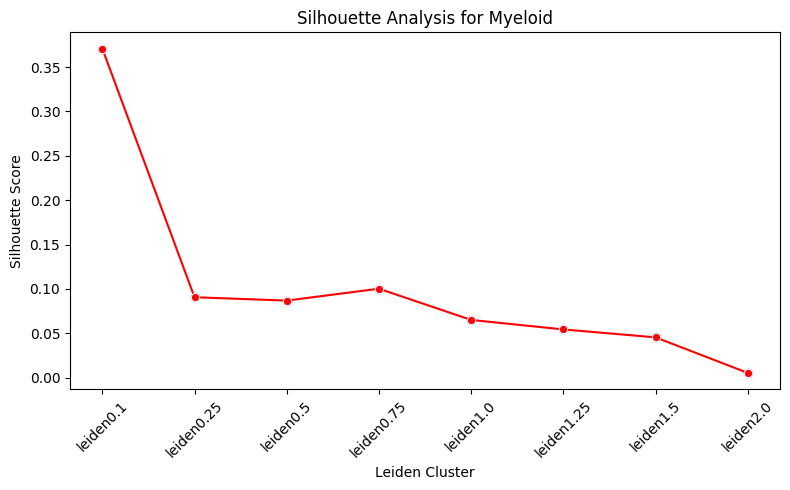

In [5]:
funcs.silhouette(adata, silhouette_res_dir = "../silhouette_res_scVI/", cell_type = cell_type)

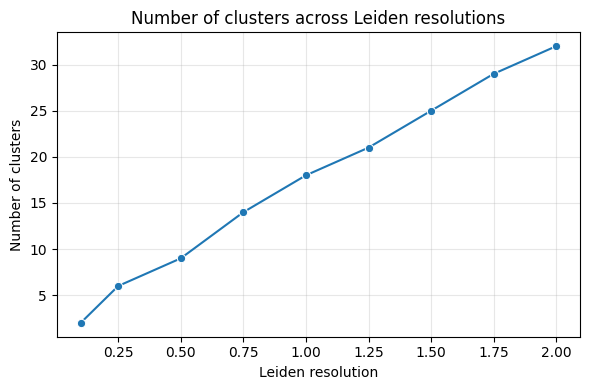

In [6]:
cluster_df, fig = funcs.leiden_resolution_summary(adata)

### Use Leiden 0.5

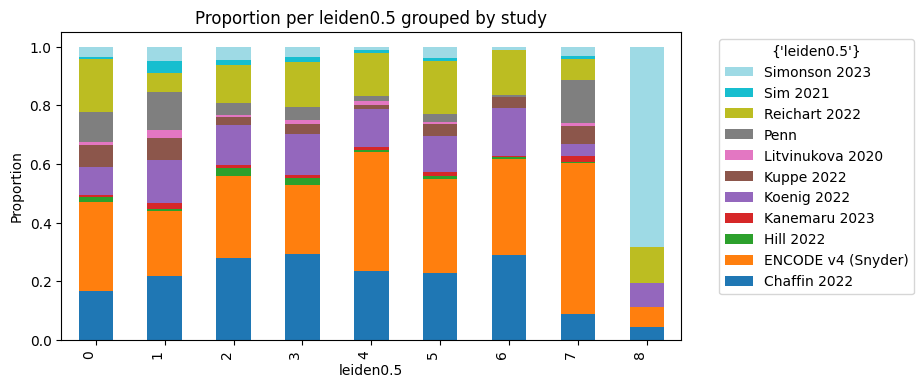

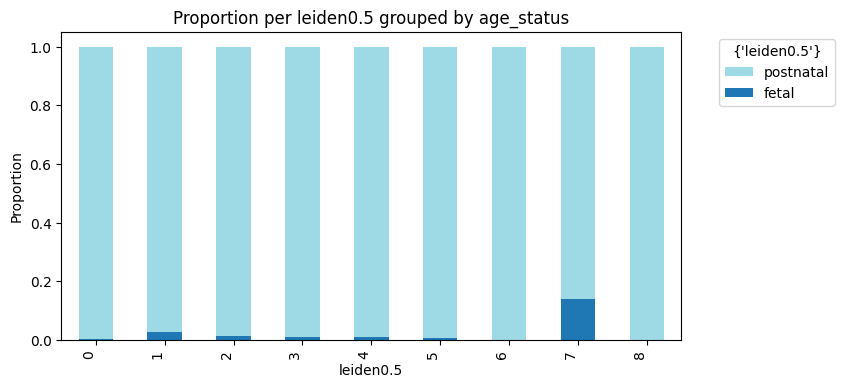

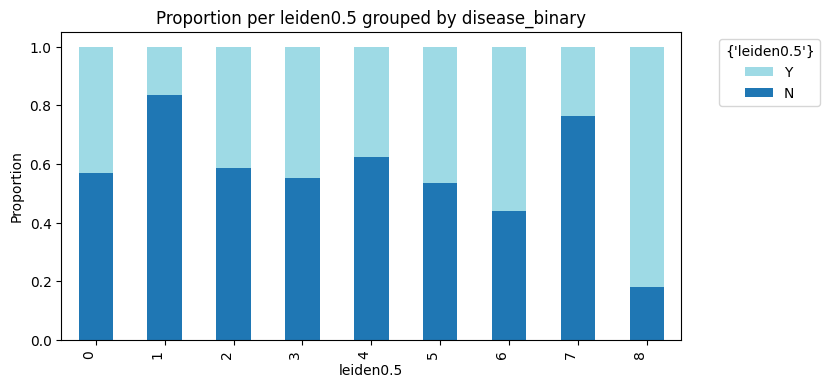

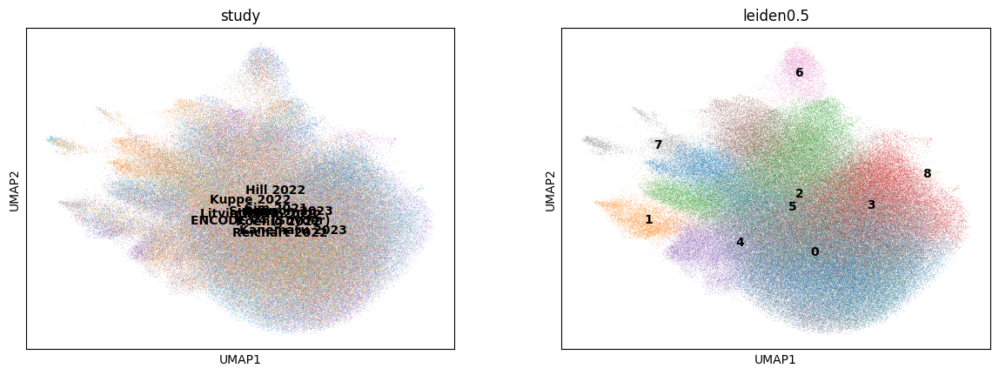

/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:482: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean

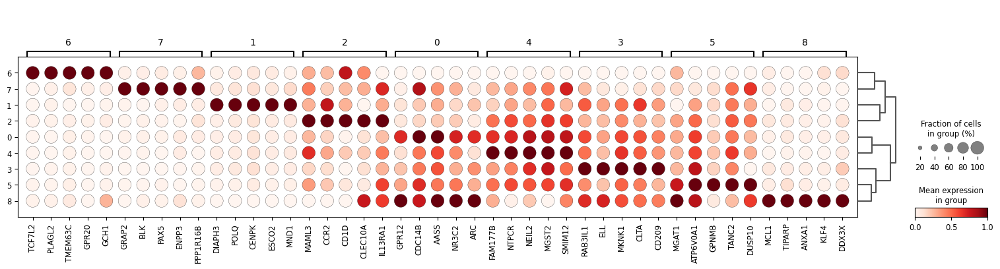

Counter({'0': 73865, '2': 51644, '5': 40949, '3': 39612, '4': 22432, '1': 6120, '6': 3736, '7': 2891, '8': 88})
CPU times: user 18min 11s, sys: 1h 48min 51s, total: 2h 7min 2s
Wall time: 2min 18s


['leiden0.5',
 AnnData object with n_obs × n_vars = 241337 × 16115
     obs: 'age', 'donor_id', 'sex', 'region', 'cell_type', 'disease', 'consistent_cell_type', 'study', 'technology', 'cell_or_nuclei', 'barcode', 'sample_id', 'age_status', 'tech_plus_study', 'disease_binary', 'decade', 'age_group', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'scvi_cell_type', 'redo_leiden_0.5', 'UMAP1', 'UMAP2', 'v2_scvi_cell_type', 'final_cell_type', 'total_UMI', 'log10_UMI', 'endo_score', 'cm_score', 'fib_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'leiden0.1', 'leiden0.25', 'leiden0.5', 'leiden0.75', 'leiden1.0', 'leiden1.25', 'leiden1.5', 'l

In [7]:
%%time
leiden_key = "leiden0.5"
funcs.specify_leiden_subclustering(adata=adata, leiden=leiden_key)

In [8]:
Counter(adata.obs[leiden_key])

Counter({'0': 73865,
         '2': 51644,
         '5': 40949,
         '3': 39612,
         '4': 22432,
         '1': 6120,
         '6': 3736,
         '7': 2891,
         '8': 88})

In [9]:
adata.obs['age_disease'] = adata.obs['age_status'].astype(str) + ":" + adata.obs['disease'].astype(str)

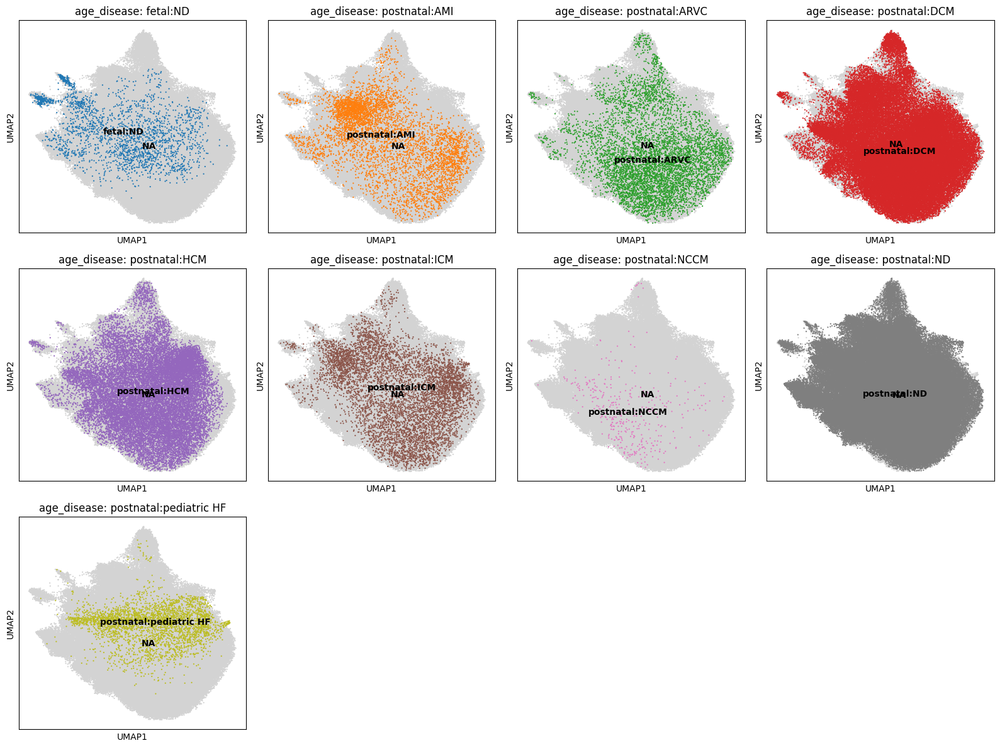

In [10]:
funcs.plot_umap_by_cluster(adata, metadata_key = "age_disease")

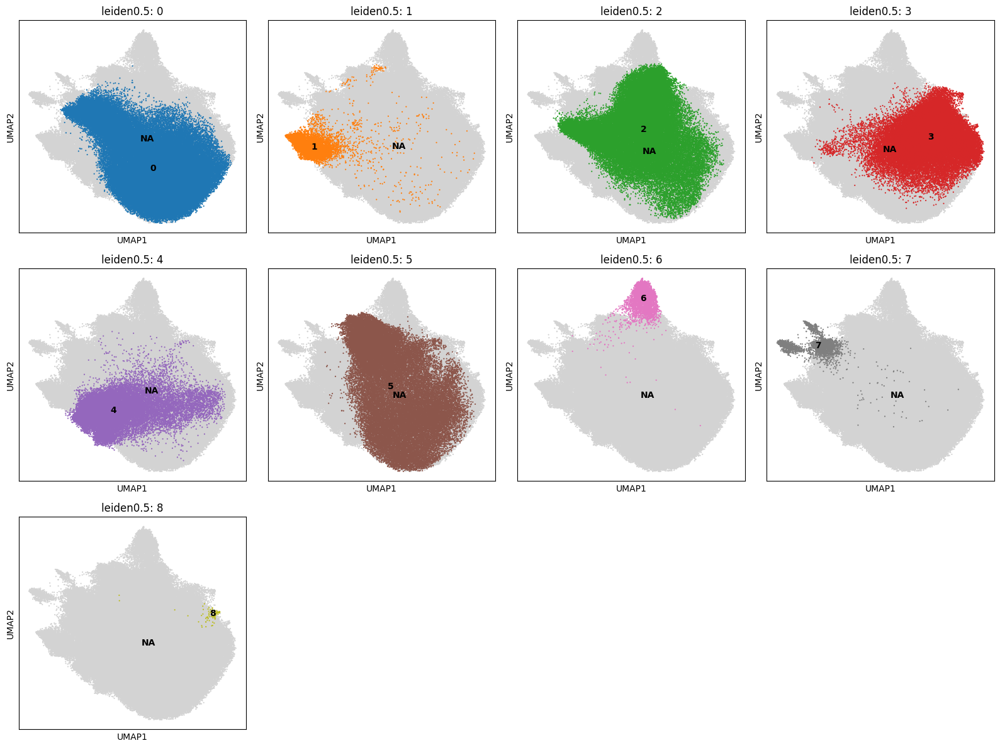

In [11]:
funcs.plot_umap_by_cluster(adata, metadata_key = leiden_key)

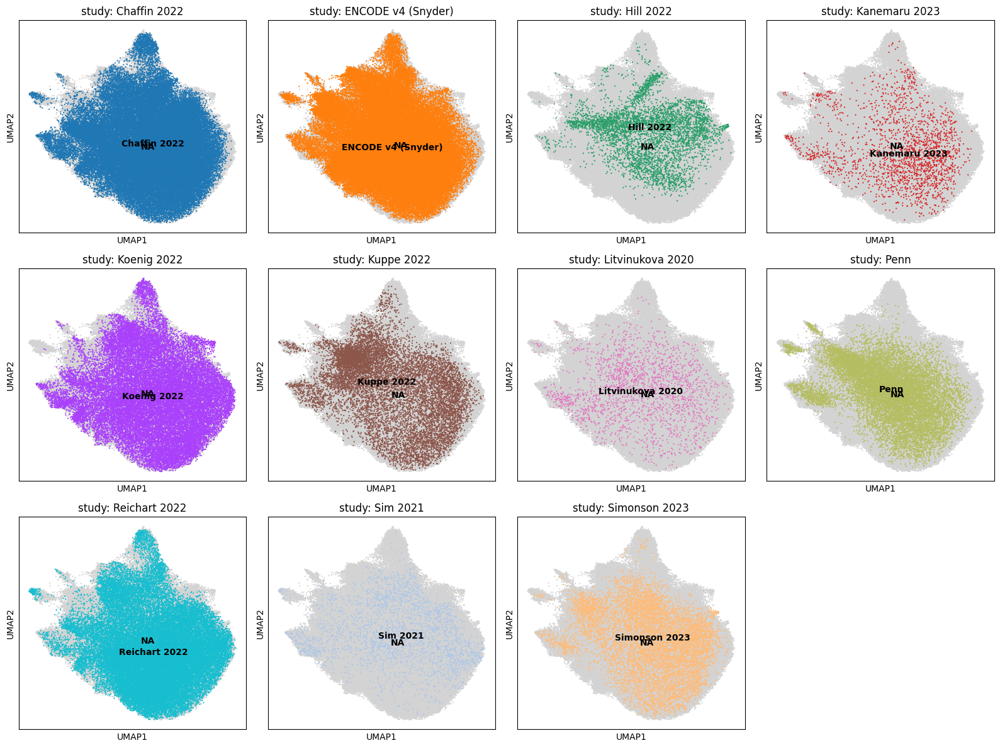

In [12]:
funcs.plot_umap_by_cluster(adata, metadata_key = "study")

### Examine enrichment along metadata categories

/mnt/data1/william/human_heart_project/Final_manuscript_analysis/RNA/aggregated_analysis/v4_subclustering_analysis/examine_covariates/perform_annotation/subcluster_funcs.py:346: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for clust, sub in metadata.groupby(cluster_label):


<module 'matplotlib.pyplot' from '/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/matplotlib/pyplot.py'>


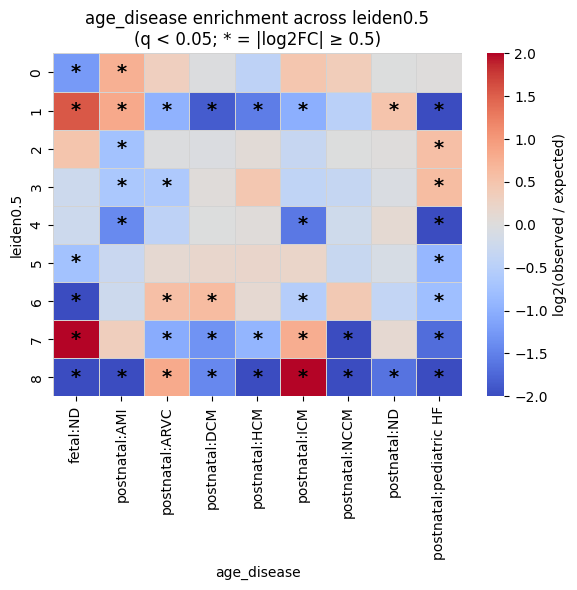

In [13]:
test_df, enrich_df, plot = funcs.chi_square_per_subcluster(
    metadata=adata.obs,
    cluster_label=leiden_key,
    study_col="age_disease",
    min_cells=50, figsize_tuple = (6,6)
)

### Marker gene / ORA analysis

In [14]:
#sc.get.rank_genes_groups_df(adata, group="4").head(60)['names']

In [15]:
#sc.pl.violin(adata, keys = "TIMD4", groupby = leiden_key)

Processing Cluster 0... Success.
Processing Cluster 1... Success.
Processing Cluster 2... Success.
Processing Cluster 3... Success.
Processing Cluster 4... Success.
Processing Cluster 5... Success.
Processing Cluster 6... Success.
Processing Cluster 7... Success.
Processing Cluster 8... Success.


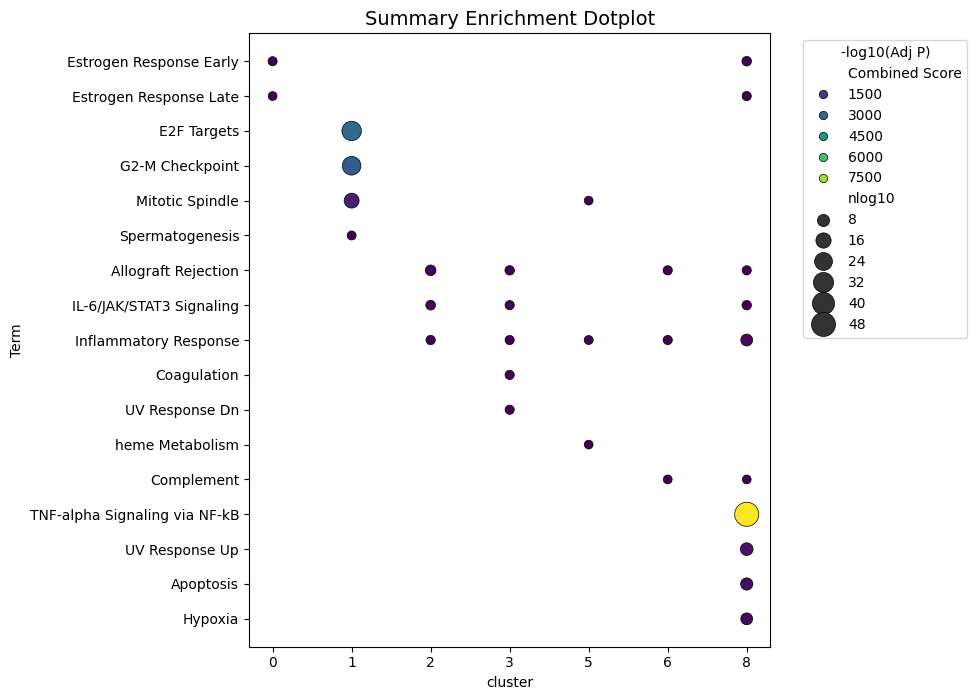

In [16]:
funcs.plot_all_cluster_enrichment(
     adata, cluster_key=leiden_key, 
     gene_sets=["MSigDB_Hallmark_2020"], outdir=None,top_n=100)

### Subcluster annotation

- Cluster 0 are the general myeloid cluster ("other")
- Cluster 1 are cycling cells (CDK1/TOP2A/EZH2)
- Cluster 2 are CCR2+ monocytes: CCR2/LYZ/CD1C
- Cluster 3 are resident, scavenging macrophages (STAB1 - scavenger protein; also cathepsin CTSB/CTSL)
- Cluster 4 are macrophages with metabolic signatures (PFKFB2/HMGCL/FECH/PFKFB2)
- Cluster 5 overlaps a lot with cluster 0, call "other"
- Cluster 6 are M2 monocytes (ARG1/LILRB1/LILRB2/ITGAL)
- Cluster 7 are contaminant lymphoid cells (PAX5/MS4A1/POU2AF1)

In [17]:
adata.obs['subcluster'] = adata.obs[leiden_key].map({
    "0": "Other",
    "1": "Cycling",
    "2": "Monocyte_derived",
    "3": "Resident-scavenging",
    "4": "Metabolic",
    "5": "Other",
    "6": "Anti_Inf",
    "7": "Lymphoid",
    "8": "Other"
})

In [18]:
%%time
filt_adata = adata[adata.obs.subcluster != "Lymphoid"].copy()
filt_adata

CPU times: user 8.55 s, sys: 29.9 s, total: 38.5 s
Wall time: 38.5 s


AnnData object with n_obs × n_vars = 238446 × 16115
    obs: 'age', 'donor_id', 'sex', 'region', 'cell_type', 'disease', 'consistent_cell_type', 'study', 'technology', 'cell_or_nuclei', 'barcode', 'sample_id', 'age_status', 'tech_plus_study', 'disease_binary', 'decade', 'age_group', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'scvi_cell_type', 'redo_leiden_0.5', 'UMAP1', 'UMAP2', 'v2_scvi_cell_type', 'final_cell_type', 'total_UMI', 'log10_UMI', 'endo_score', 'cm_score', 'fib_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'leiden0.1', 'leiden0.25', 'leiden0.5', 'leiden0.75', 'leiden1.0', 'leiden1.25', 'leiden1.5', 'leiden1.75', 'lei

### further subclustering for large clusters

#### leiden cluster 2

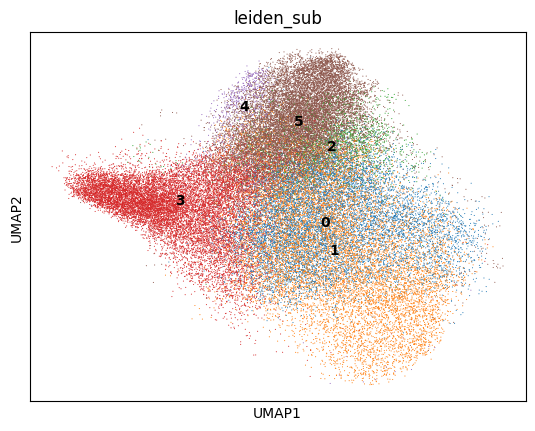

CPU times: user 4.44 s, sys: 2.11 s, total: 6.55 s
Wall time: 6.37 s


In [19]:
%%time
adata_2 = filt_adata[filt_adata.obs[leiden_key] == '2'].copy()
# re-run UMAP to see the internal structure
sc.tl.leiden(adata_2, flavor="igraph", n_iterations=2, resolution=0.5, 
             key_added = 'leiden_sub')
sc.pl.umap(adata_2, color = "leiden_sub", legend_loc = "on data")
#funcs.specify_leiden_subclustering(adata=adata_2, leiden="leiden_sub")

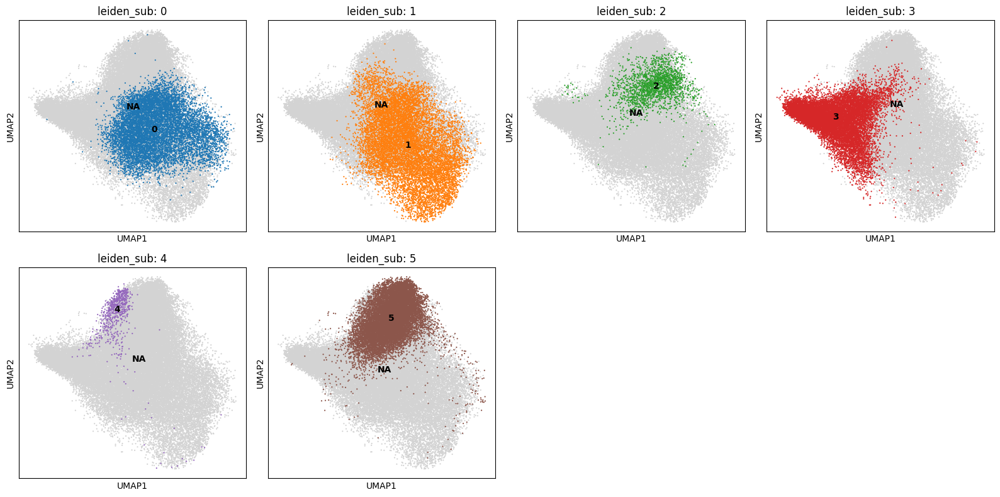

In [20]:
funcs.plot_umap_by_cluster(adata_2, metadata_key = "leiden_sub")

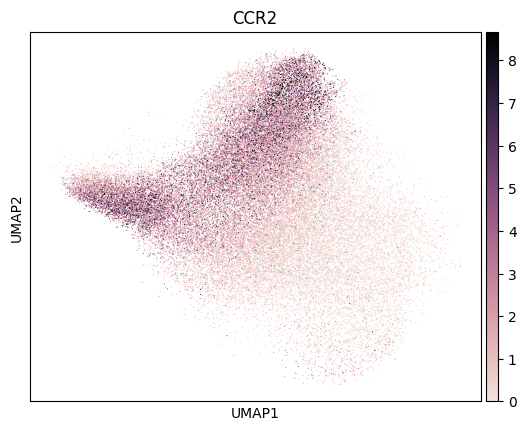

In [21]:
sc.pl.umap(adata_2, color="CCR2", cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True),
    vmin=0, vmax="p99")

In [22]:
adata_2.obs['subcluster'] = (
    adata_2.obs['leiden_sub'].astype(str)
    .map(lambda x: 'Monocyte_derived' if x in {'3','4','5'} else 'Resident')
    .astype('category')
)

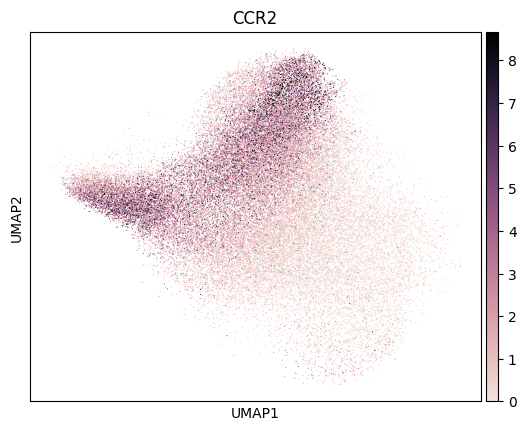

In [23]:
sc.pl.umap(adata_2, color="CCR2", cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True),
    vmin=0, vmax="p99")

In [24]:
filt_adata.obs.update(adata_2.obs[['subcluster']])

#### cluster 0

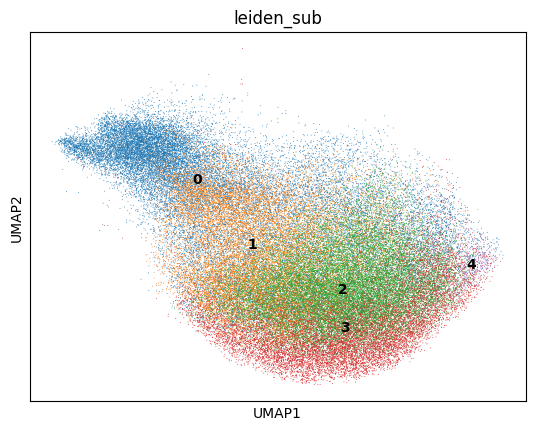

CPU times: user 6.08 s, sys: 6 s, total: 12.1 s
Wall time: 11.9 s


In [25]:
%%time
adata_0 = filt_adata[filt_adata.obs[leiden_key] == '0'].copy()
# re-run UMAP to see the internal structure
sc.tl.leiden(adata_0, flavor="igraph", n_iterations=2, resolution=0.5, 
             key_added = 'leiden_sub')
sc.pl.umap(adata_0, color = "leiden_sub", legend_loc = "on data")
#funcs.specify_leiden_subclustering(adata=adata_2, leiden="leiden_sub")

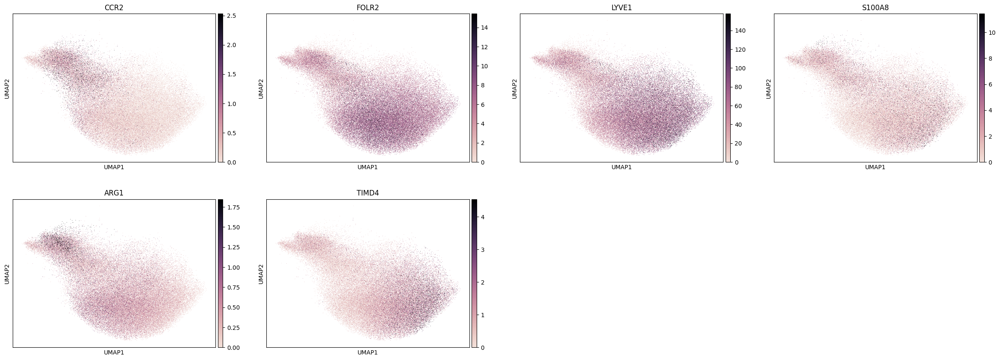

In [26]:
sc.pl.umap(adata_0, color=["CCR2", "FOLR2", "LYVE1",
                         "S100A8", "ARG1", "TIMD4"], cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True),
    vmin=0, vmax="p99")

In [27]:
adata_0.obs['subcluster'] = (
    adata_0.obs['leiden_sub'].astype(str)
    .map(lambda x: 'Monocyte_derived' if x in {'0'} else 'Resident')
    .astype('category')
)

filt_adata.obs.update(adata_0.obs[['subcluster']])

In [28]:
#sc.pl.umap(filt_adata, color=["CCR2", "FOLR2", "LYVE1",
#                         "S100A8", "ARG1", "TIMD4"], cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True),
#           vmin=0, vmax="p99")

#### cluster 5

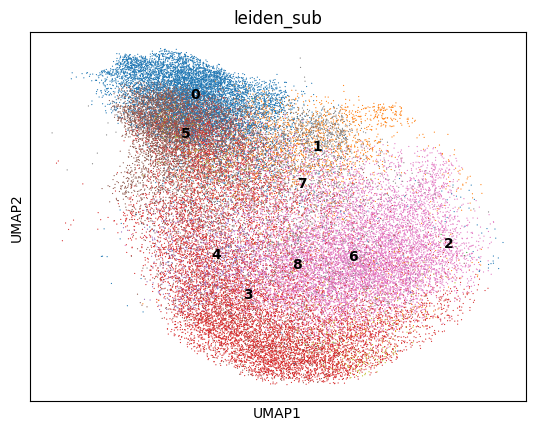

CPU times: user 3.53 s, sys: 4.55 s, total: 8.08 s
Wall time: 7.9 s


In [29]:
%%time
adata_5 = filt_adata[filt_adata.obs[leiden_key] == '5'].copy()
# re-run UMAP to see the internal structure
sc.tl.leiden(adata_5, flavor="igraph", n_iterations=2, resolution=0.5, 
             key_added = 'leiden_sub')
sc.pl.umap(adata_5, color = "leiden_sub", legend_loc = "on data")
#funcs.specify_leiden_subclustering(adata=adata_2, leiden="leiden_sub")

In [30]:
#funcs.plot_umap_by_cluster(adata_5, metadata_key = "leiden_sub")
#sc.pl.violin(adata_5, keys = "CCR2", groupby = "leiden_sub")

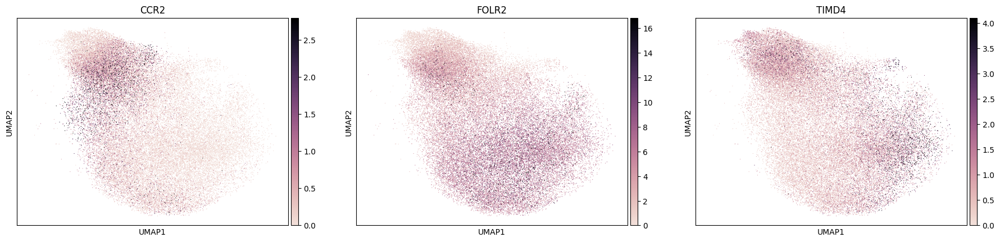

In [31]:
sc.pl.umap(adata_5, color=["CCR2", "FOLR2", "TIMD4"], cmap=sns.cubehelix_palette(dark=0, light=.9, as_cmap=True),
    vmin=0, vmax="p99")

In [32]:
adata_5.obs['subcluster'] = (
    adata_5.obs['leiden_sub'].astype(str)
    .map(lambda x: 'Monocyte_derived' if x in {'0', '3', '5'} else 'Resident')
    .astype('category')
)

filt_adata.obs.update(adata_5.obs[['subcluster']])

### produce plots

In [33]:
filt_adata.obs['subcluster'] = (
    filt_adata.obs['subcluster']
    .replace({'Other': 'Resident'})
)

In [34]:
Counter(filt_adata.obs.subcluster)

Counter({'Resident': 89897,
         'Monocyte_derived': 76649,
         'Resident-scavenging': 39612,
         'Metabolic': 22432,
         'Cycling': 6120,
         'Anti_Inf': 3736})

In [35]:
subcluster_order = [
    "Anti_Inf",
    "Cycling",
    "Metabolic",
    "Monocyte_derived",
    "Resident",
    "Resident-scavenging",
]

filt_adata.obs['subcluster'] = pd.Categorical(
    filt_adata.obs['subcluster'], categories=subcluster_order, ordered=True
)

subcluster_colors = {    
    "Resident": "orange",
    "Cycling": "pink",           
    "Monocyte_derived": "red",  
    "Resident-scavenging": "blue",          
    "Metabolic": "magenta",          
    "Anti_Inf": "cyan",       
}

filt_adata.uns['subcluster_colors'] = [subcluster_colors[sc] for sc in subcluster_order]

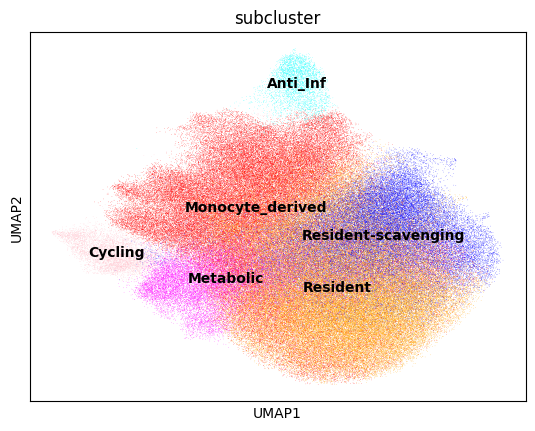

In [36]:
with plt.rc_context(): 
    sc.pl.umap(filt_adata, color = ['subcluster'], legend_loc = "on data", palette=subcluster_colors, show=False)
    plt.savefig(plots_dir + cell_type + "_subclustered.pdf", bbox_inches="tight")

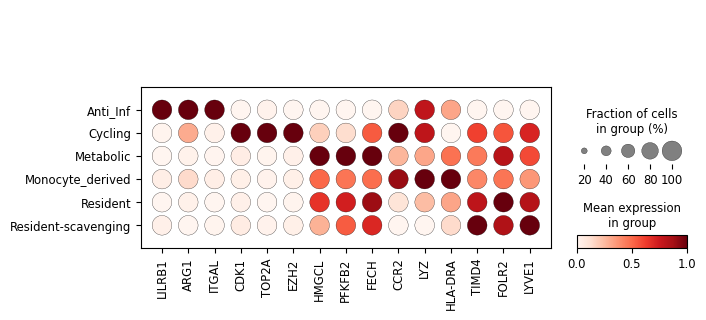

In [37]:
with plt.rc_context(): 
    sc.pl.dotplot(filt_adata, var_names = ["LILRB1", "ARG1", "ITGAL",
                                           "CDK1", "TOP2A", "EZH2",
                                           "HMGCL", "PFKFB2", "FECH",
                                           "CCR2", "LYZ", "HLA-DRA",
                                           "TIMD4", "FOLR2", "LYVE1"], dot_max=1,
                  groupby = "subcluster", show=False, standard_scale='var')
    plt.savefig(plots_dir + cell_type + "_subclustered_dotplot.pdf", bbox_inches="tight")

### Show enrichments by disease-age status and age group

In [38]:
adata_metadata = filt_adata.obs

disease_filtered_metadata = adata_metadata[~adata_metadata['age_disease'].isin(["postnatal:ARVC", "postnatal:NCCM"])].copy()
for col in disease_filtered_metadata.select_dtypes('category').columns:
    disease_filtered_metadata[col] = disease_filtered_metadata[col].cat.remove_unused_categories()
    
ND_adata_metadata = adata_metadata[adata_metadata['disease_binary'] == "N"].copy()

/mnt/data1/william/human_heart_project/Final_manuscript_analysis/RNA/aggregated_analysis/v4_subclustering_analysis/examine_covariates/perform_annotation/subcluster_funcs.py:346: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for clust, sub in metadata.groupby(cluster_label):


<module 'matplotlib.pyplot' from '/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/matplotlib/pyplot.py'>


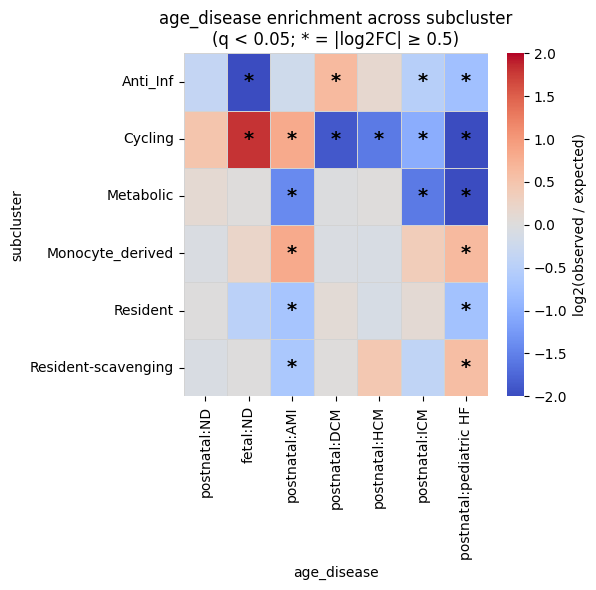

In [39]:
test_df, enrich_df, plot = funcs.chi_square_per_subcluster(
    metadata=disease_filtered_metadata,
    cluster_label="subcluster",
    study_col="age_disease",
    metadata_order = ['postnatal:ND', 'fetal:ND', 'postnatal:AMI', 'postnatal:DCM', 
                      'postnatal:HCM', 'postnatal:ICM', 'postnatal:pediatric HF'],
    min_cells=50, figsize_tuple = (6,6)
)

plot.savefig(plots_dir + cell_type + "_subcluster_age_disease.pdf")

/mnt/data1/william/human_heart_project/Final_manuscript_analysis/RNA/aggregated_analysis/v4_subclustering_analysis/examine_covariates/perform_annotation/subcluster_funcs.py:346: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for clust, sub in metadata.groupby(cluster_label):


<module 'matplotlib.pyplot' from '/home/william/anaconda3/envs/r-kernel/lib/python3.12/site-packages/matplotlib/pyplot.py'>


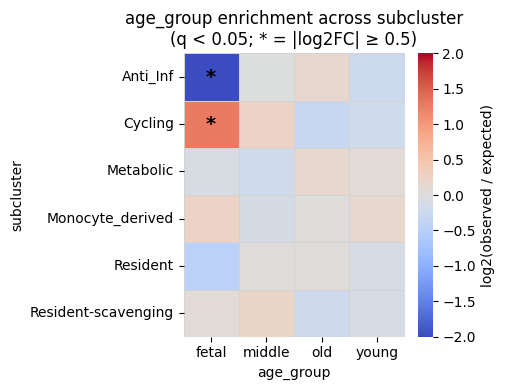

In [40]:
test_df, enrich_df, plot = funcs.chi_square_per_subcluster(
    metadata=ND_adata_metadata,
    cluster_label="subcluster",
    study_col="age_group",
    min_cells=50, figsize_tuple = (5, 4)
)

plot.savefig(plots_dir + cell_type + "_subcluster_aging.pdf")

In [41]:
Counter(filt_adata.obs.subcluster)

Counter({'Resident': 89897,
         'Monocyte_derived': 76649,
         'Resident-scavenging': 39612,
         'Metabolic': 22432,
         'Cycling': 6120,
         'Anti_Inf': 3736})

In [42]:
subcluster_stats = (
    filt_adata.obs['subcluster']
    .value_counts(normalize=False)
    .rename("count")
    .reset_index()
    .rename(columns={"index": "subcluster"})
)

subcluster_stats["proportion"] = subcluster_stats["count"] / subcluster_stats["count"].sum()

print(subcluster_stats)

            subcluster  count  proportion
0             Resident  89897    0.377012
1     Monocyte_derived  76649    0.321452
2  Resident-scavenging  39612    0.166126
3            Metabolic  22432    0.094076
4              Cycling   6120    0.025666
5             Anti_Inf   3736    0.015668


### Save metadata

In [43]:
filt_adata.write(post_subclustering_dir + cell_type + ".h5ad")

In [44]:
filt_adata.obs.to_csv(post_subclustering_dir + cell_type + "_annotation.csv")